In [46]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
%matplotlib inline
from datetime import date, datetime, timedelta
import pickle
import plotly.offline as py
import plotly.graph_objs as go
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
import cufflinks as cf
import seaborn as sns

In [47]:
turbine_readings = pickle.load(open("./data/turbine_readings.pickle","rb")) 
weather_data = pd.read_csv("hourly_weather_data.csv")

In [48]:
timestamps = turbine_readings["timestamp"]
turbine_readings = turbine_readings.iloc[:, 0:74]
print(turbine_readings.shape)
turbine_readings["timestamp"] = timestamps

(2600, 74)


Preprocessing both turbine data and weather data.

In [49]:
weather_data = weather_data.dropna(axis=1, how="all")
weather_data.fillna(method="ffill", inplace=True)
weather_data["timestamp"] = pd.to_datetime(weather_data["valid_time_gmt"], unit="s") - pd.Timedelta("08:00:00")
weather_data["weather_date"] = weather_data["timestamp"].dt.date
weather_data["weather_time"] = weather_data["timestamp"].dt.time
weather_data["weather_month"] = weather_data["timestamp"].dt.month
weather_data["weather_day_of_month"] = weather_data["timestamp"].dt.day
weather_data["weather_day_of_week"] = weather_data["timestamp"].dt.dayofweek

turbine_readings["turbine_date"] = turbine_readings["timestamp"].dt.date
turbine_readings["turbine_time"] = turbine_readings["timestamp"].dt.time
turbine_readings["turbine_month"] = turbine_readings["timestamp"].dt.month
turbine_readings["turbine_day_of_month"] = turbine_readings["timestamp"].dt.day
turbine_readings["turbine_day_of_week"] = turbine_readings["timestamp"].dt.dayofweek

turbine_names = [col for col in turbine_readings if col.startswith("kW")]

count = 1
for index, row in turbine_readings.iterrows():
    if count == 101:
        count = 1
    turbine_readings.loc[index, "reading_in_week"] = count
    count += 1
    turbine = turbine_readings.loc[index, turbine_names]
    turbine_readings.loc[index, "median_kW_reading"] = turbine.median()
    turbine_readings.loc[index, "avg_kW_reading"] = turbine.mean()

feature_dict = {"wspd" : "Windspeed (mph)",
                "wdir" : "Wind Direction (azimuth)",
                "temp" : "Temperature (Fahrenheit)",
                "feels_like" : "Feels Like Temperature (Fahrenheit)"}

In [50]:
for feature in feature_dict:
    trace = go.Scatter(
        x=weather_data["timestamp"],
        y=weather_data[feature],
        mode="lines",
        name=feature_dict[feature],
    )
    
    data = [trace]
    
    layout = go.Layout(
        title=feature_dict[feature],
        yaxis=dict(title=feature_dict[feature])
    )

    fig = go.Figure(data=data, layout=layout)
    py.iplot(fig)

In [51]:
for feature in feature_dict:
    trace1 = go.Scatter(
        x=turbine_readings["timestamp"],
        y=turbine_readings["avg_kW_reading"],
        mode="lines",
        name="Average Turbine Reading"
    )

    trace2 = go.Scatter(
        x=weather_data["timestamp"],
        y=weather_data[feature],
        mode="lines",
        name=feature_dict[feature],
        yaxis="y2"
    )

    data = [trace1, trace2]
    layout = go.Layout(
        title='Turbine Output vs. ' + feature_dict[feature],
        yaxis=dict(
            title='Turbine Output (kWh)',
            titlefont=dict(
                color='#1f77b4'
            ),
            tickfont=dict(
                color='#1f77b4'
            )
        ),
        yaxis2=dict(
            title=feature_dict[feature],
            titlefont=dict(
                color='#ff7f0e'
            ),
            tickfont=dict(
                color='#ff7f0e'
            ),
            overlaying='y',
            side='right'
        )
    )

    fig = go.Figure(data=data, layout=layout)
    py.iplot(fig)

In [52]:
turbine_weather_df = pd.merge_asof(left=turbine_readings, right=weather_data, on="timestamp", direction="nearest")
turbine_weather_df.to_csv("./data/turbine&weather_combined_74turbines.csv", index=False)
pickle_out = open("./data/turbine&weather_combined_74turbines.pickle", "wb")
pickle.dump(turbine_weather_df, pickle_out)
pickle_out.close()

In [53]:
for feature in feature_dict:
    trace = go.Scatter(x=turbine_weather_df[feature],
                       y=turbine_weather_df["avg_kW_reading"],
                       mode='markers',
                       opacity=.9)
    data=[trace]

    layout = go.Layout(
        title='Turbine Output vs. ' + feature_dict[feature],
        yaxis=dict(
            title='Turbine Output (kWh)'
        ),
        xaxis=dict(
            title=feature_dict[feature]
        )
    )

    fig = go.Figure(data=data, layout=layout)
    py.iplot(fig)

Text(0.5,1,'Average Temperature by Time of Day')

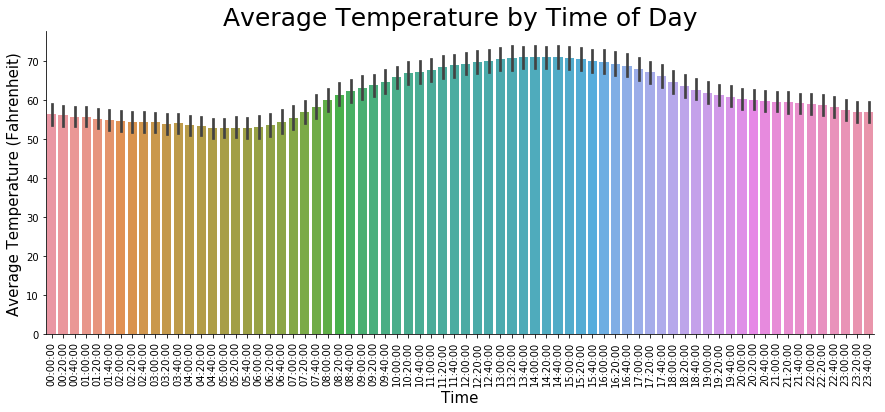

In [70]:
fig = sns.catplot(x="weather_time" ,y="temp", data=weather_data, kind='bar', aspect=2.5, ci=95, n_boot=1000)
fig.set_xticklabels(rotation=90)
fig.set_xlabels("Time", fontsize=15)
fig.set_ylabels("Average Temperature (Fahrenheit)", fontsize=15)
plt.title("Average Temperature by Time of Day", fontsize=25)

Text(0.5,1,'Turbine Readings w/o Timestamps')

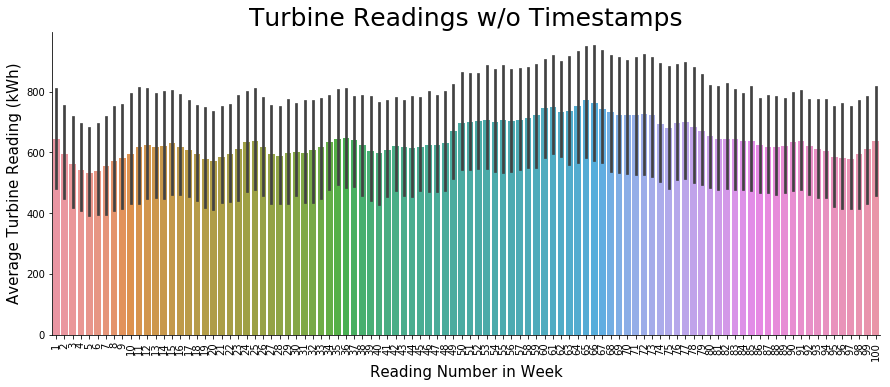

In [55]:
fig = sns.catplot(x="reading_in_week" ,y="avg_kW_reading", data=turbine_readings, kind='bar', aspect=2.5, ci=95, n_boot=1000)
fig.set_xticklabels(range(1, 101), rotation=90)
fig.set_xlabels("Reading Number in Week", fontsize=15)
fig.set_ylabels("Average Turbine Reading (kWh)", fontsize=15)
plt.title("Turbine Readings w/o Timestamps", fontsize=25)

Text(0.5,1,'Turbine Reading by Time of Day')

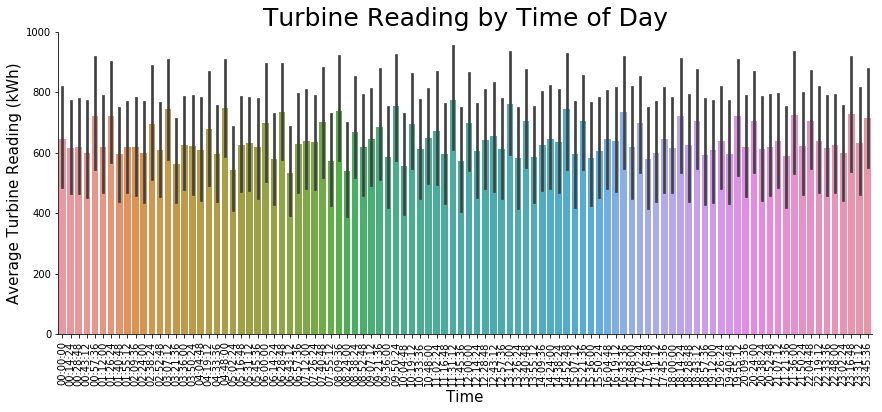

In [56]:
turbine_readings = turbine_readings.sort_values(by=["turbine_time"])
fig = sns.catplot(x="turbine_time" ,y="avg_kW_reading", data=turbine_readings, kind='bar', aspect=2.5, ci=95, n_boot=1000)
fig.set_xticklabels(rotation=90)
fig.set_xlabels("Time", fontsize=15)
fig.set_ylabels("Average Turbine Reading (kWh)", fontsize=15)
plt.title("Turbine Reading by Time of Day", fontsize=25)

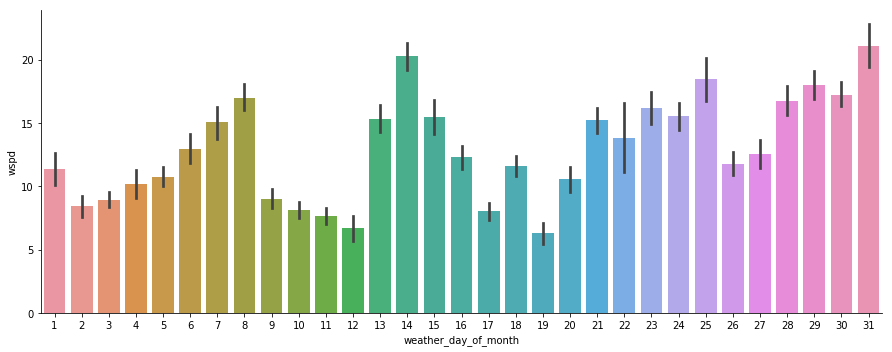

In [57]:
fig = sns.catplot(x="weather_day_of_month" ,y="wspd", data=weather_data, kind='bar', aspect=2.5, ci=95, n_boot=1000)

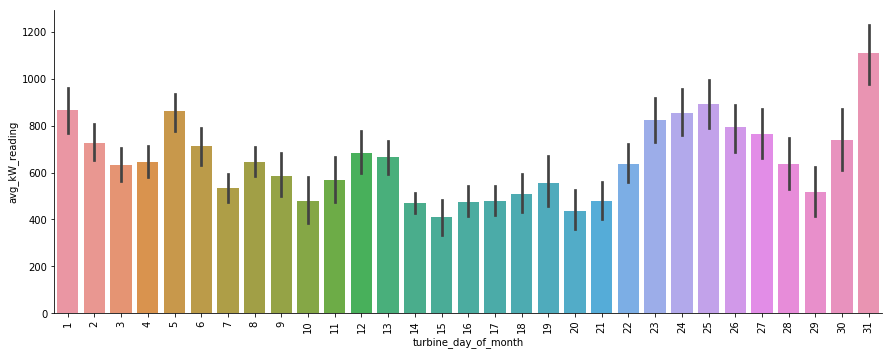

In [58]:
fig = sns.catplot(x="turbine_day_of_month" ,y="avg_kW_reading", data=turbine_readings, kind='bar', aspect=2.5, ci=95, n_boot=1000)
fig.set_xticklabels(rotation=90)

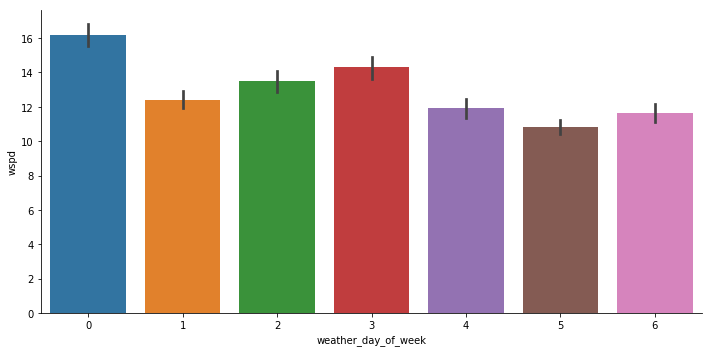

In [59]:
fig = sns.catplot(x="weather_day_of_week" ,y="wspd", data=weather_data, kind='bar', aspect=2, ci=95, n_boot=1000)

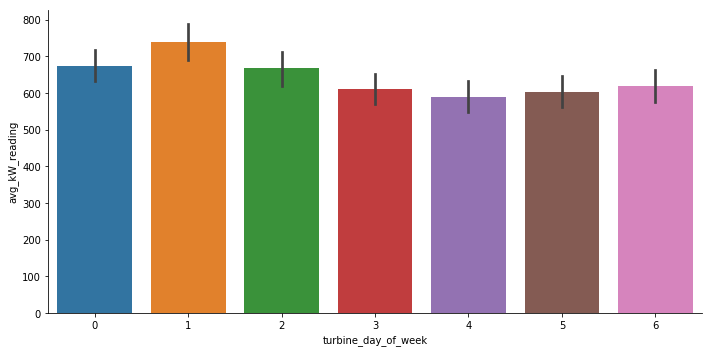

In [60]:
fig = sns.catplot(x="turbine_day_of_week" ,y="avg_kW_reading", data=turbine_readings, kind='bar', aspect=2, ci=95, n_boot=1000)

Text(0.5,1,'Average Temperature by Month')

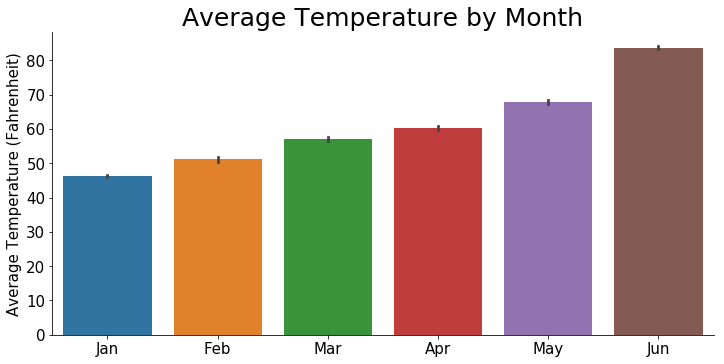

In [82]:
fig = sns.catplot(x="weather_month" ,y="temp", data=weather_data, kind='bar', aspect=2, ci=95, n_boot=1000)
fig.set_xticklabels(["Jan", "Feb", "Mar", "Apr", "May", "Jun"], fontsize=15)
fig.set_yticklabels(fontsize=15)
fig.set_xlabels("")
fig.set_ylabels("Average Temperature (Fahrenheit)", fontsize=15)
plt.title("Average Temperature by Month", fontsize=25)

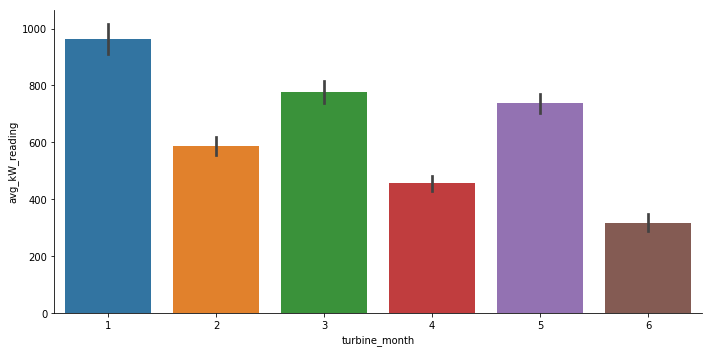

In [62]:
fig = sns.catplot(x="turbine_month" ,y="avg_kW_reading", data=turbine_readings, kind='bar', aspect=2, ci=95, n_boot=1000)

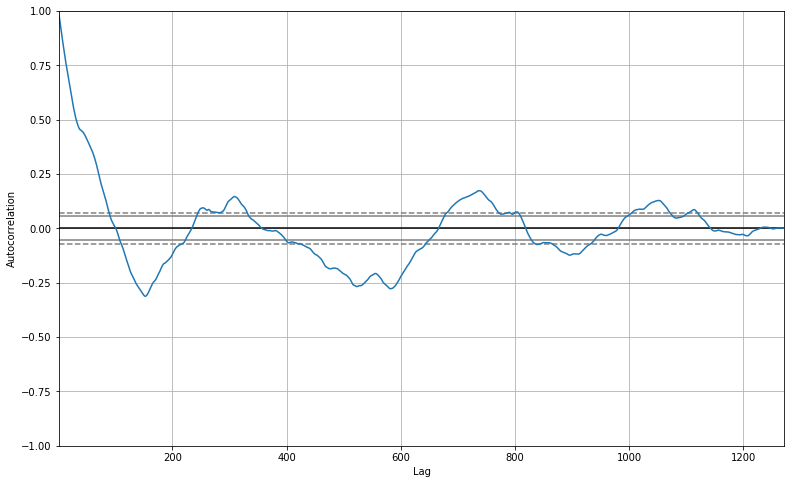

In [63]:
turbine_readings = turbine_readings.sort_index()
turbine_readings_subset = turbine_readings.loc[turbine_readings["timestamp"] <= datetime(2016, 3, 30)]

from pandas.plotting import autocorrelation_plot
plt.figure(figsize=(13,8))
autocorrelation_plot(turbine_readings_subset["avg_kW_reading"])

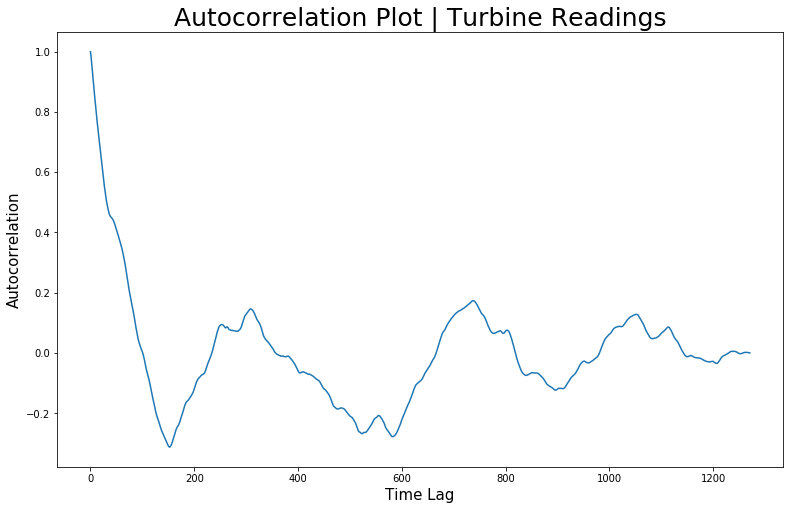

In [64]:
from statsmodels.tsa.stattools import acf
autocorrelation = acf(turbine_readings_subset["avg_kW_reading"], nlags=3000)
plt.figure(figsize=(13,8))
plt.title("Autocorrelation Plot | Turbine Readings", fontsize=25)
plt.xlabel("Time Lag", fontsize=15)
plt.ylabel("Autocorrelation", fontsize=15)
plt.plot(autocorrelation)

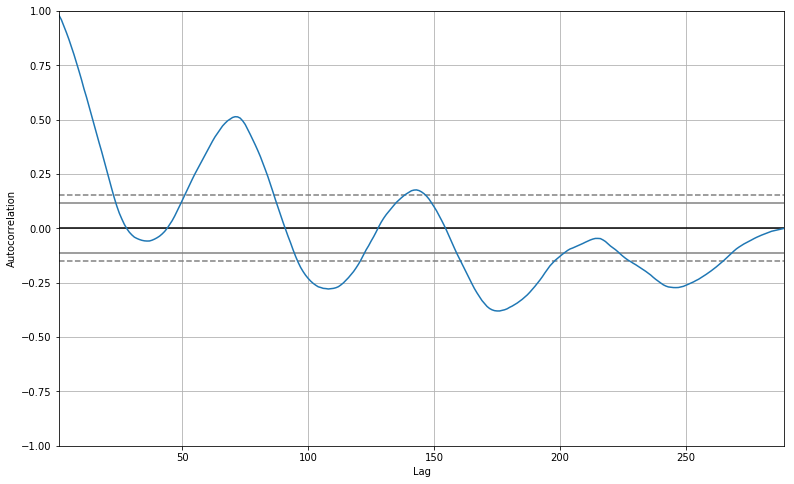

In [68]:
weather_data_subset = weather_data.loc[weather_data["timestamp"] <= datetime(2016, 1, 5)]
weather_data_subset = weather_data_subset.dropna(subset=["wspd"])
feature = "temp"
plt.figure(figsize=(13,8))
autocorrelation_plot(weather_data_subset[feature])

           0
60  0.358573
61  0.380054
62  0.400756
63  0.420633
64  0.437590
65  0.455378
66  0.470880
67  0.483458
68  0.494718
69  0.502618
70  0.510033
71  0.513506
72  0.512690
73  0.506955
74  0.494396
75  0.477793
76  0.455154
77  0.431973
78  0.407770
79  0.383566
            0
130  0.047093
131  0.063611
132  0.077885
133  0.092601
134  0.105807
135  0.119302
136  0.130073
137  0.140648
138  0.150496
139  0.158737
140  0.165904
141  0.172975
142  0.176048
143  0.176830
144  0.173819
145  0.167690
146  0.159321
147  0.148170
148  0.134343
149  0.116866
(289,)


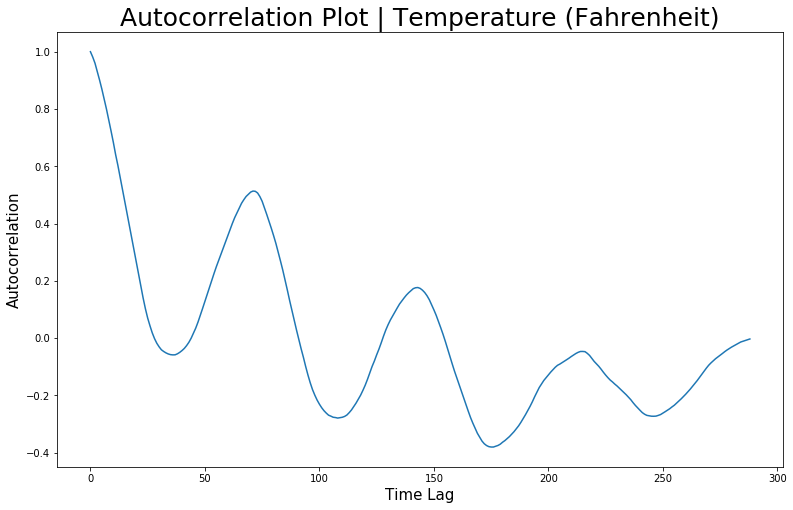

In [69]:
autocorrelation = acf(weather_data_subset[feature], nlags=5000)
df = pd.DataFrame(autocorrelation)
print(df.iloc[60:80,:])
print(df.iloc[130:150,:])
print(weather_data_subset["wspd"].shape)
plt.figure(figsize=(13,8))
plt.title("Autocorrelation Plot | " + feature_dict[feature], fontsize=25)
plt.xlabel("Time Lag", fontsize=15)
plt.ylabel("Autocorrelation", fontsize=15)
plt.plot(autocorrelation)

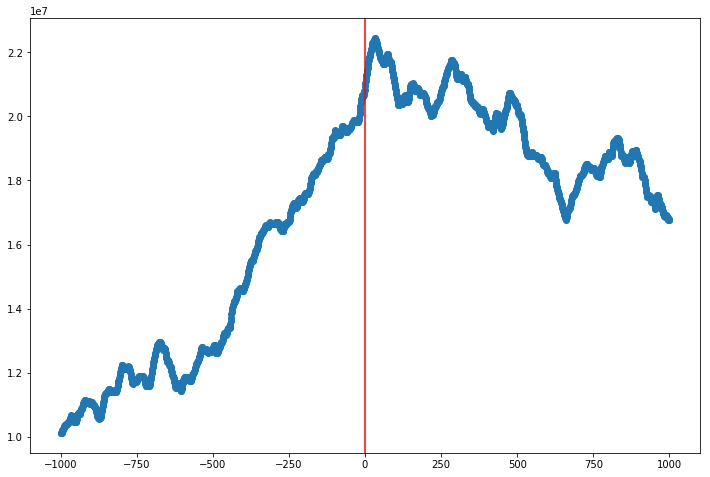

In [67]:
plt.figure(figsize=(12, 8))
plt.xcorr(turbine_weather_df["wspd"], turbine_weather_df["avg_kW_reading"], maxlags=1000, normed=False, usevlines=False)
plt.axvline(x=0, color="red")